In [3]:
#In order for the ldpc to work, you'll need to copy over the files:
#bin
#py_
#src
#data
#These are Jossy's ldpc files

import numpy as np
from scipy import signal
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd
import cmath
import time

from scipy.io import wavfile
from IPython.display import Audio

from os import path

import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.cluster import KMeans

import py_.ldpc as ldpc

# Transmitter

In [4]:
# Set parameters

N = 2048 # FFT length
L = 256 # Cyclic prefix length - can maybe lower this once we know the channel impulse respone
n = 5   # number of random random OFDM symbols
repeats = 2  # number of repeats of the n random random OFDM symbols (5: 5 in standardisation)

1. Block 1 - Chirp for synchronisation

In [5]:
def exponential_chirp(chirp_length, fs, f2, f1, window_strength):
    """Produces exponential chirp with exponential envelope"""
 
    T = chirp_length
    t = np.linspace(0, T, T * fs)
    r = f2/f1
  
    # Calculate Sine Sweep time domain values
    profile = np.sin(2*np.pi*T*f1*((r**(t/T)-1)/(np.log(r))))*(1-np.e**(-window_strength*t))*(1-np.e**(window_strength*(t-T)))
 
    return profile

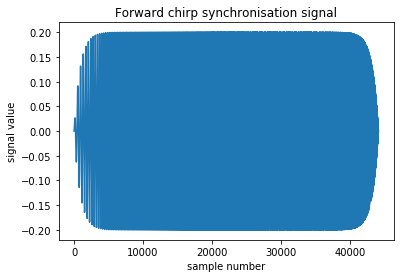

In [6]:
chirp_power = 0.2
chirp_length = 1.
fs = 44100
f2 = 10000
f1 = 100
window_strength = 50

block_1 = chirp_power*exponential_chirp(chirp_length, fs, f2, f1, window_strength)

plt.plot(block_1)
plt.title("Forward chirp synchronisation signal")
plt.xlabel("sample number")
plt.ylabel("signal value")
plt.savefig("plots/1_chirp")
plt.show()

2. Block 2 - Spacing (n+L): known random OFDM seed 2020

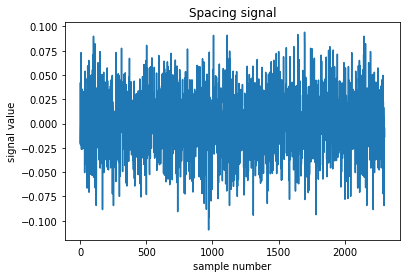

In [7]:
#Seed for generation
rng = np.random.default_rng(2020)

#Use mapping from binary
mapping = {
    (0,0): (1+1j),
    (0,1): (-1+1j),
    (1,1): (-1-1j),
    (1,0): (1-1j)}

#Generating random binary values
block_2_bits = rng.integers(low=0, high=2, size=N-2)

#Convert to OFDM symbol
block_2_symbol_half = []
for i in np.arange(0, block_2_bits.shape[0], 2):
    block_2_symbol_half.append(mapping[block_2_bits[i], block_2_bits[i+1]])
block_2_symbol_half = np.array(block_2_symbol_half)

block_2_symbol_half_conj = np.flip(np.conj(block_2_symbol_half))
block_2_symbol = np.array([0, *block_2_symbol_half, 0 , *block_2_symbol_half_conj])

block_2_wo_cyclic = np.fft.ifft(block_2_symbol, N)

block_2 = np.concatenate((block_2_wo_cyclic[-L:], block_2_wo_cyclic))

#Check if singal is real
if np.imag(block_2).all()<1e-8:
    block_2 = block_2.real
else:
    raise Exception

#Check if length is correct
assert block_2.shape[0] == N+L 

plt.plot(block_2)
plt.title("Spacing signal")
plt.xlabel("sample number")
plt.ylabel("signal value")
plt.savefig("plots/2_spacing")
plt.show()

3. Block 3 - Known OFDM symbols for channel estimation (n\*repeats\*(N+L))

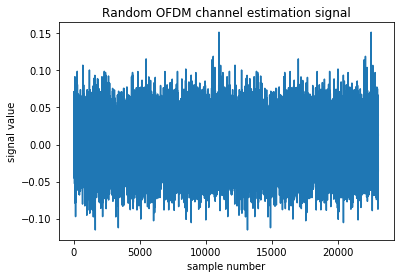

In [8]:
rng = np.random.default_rng(2021)

#Use mapping from binary
mapping = {
    (0,0): (1+1j),
    (0,1): (-1+1j),
    (1,1): (-1-1j),
    (1,0): (1-1j)}

#Generating random binary values
block_3_random_bits = rng.integers(low=0, high=2, size=n*(N-2))
block_3_bits = np.tile(block_3_random_bits, repeats).reshape(-1, N-2)

assert block_3_bits[0].all() == block_3_bits[n].all()

#Convert to OFDM symbol
block_3_symbol = []
for batch in block_3_bits:
    block_3_batch_symbol_half = []
    for i in np.arange(0, batch.shape[0], 2):
        block_3_batch_symbol_half.append(mapping[batch[i], batch[i+1]])
    block_3_batch_symbol_half = np.array(block_3_batch_symbol_half)
    block_3_batch_symbol_half_conj = np.flip(np.conj(block_3_batch_symbol_half))
    block_3_symbol.append([0, *block_3_batch_symbol_half, 0, *block_3_batch_symbol_half_conj])
block_3_symbol = np.array(block_3_symbol)
    
block_3_wo_cyclic = np.array([np.fft.ifft(batch) for batch in block_3_symbol])

block_3 = np.array([np.concatenate((batch[-L:], batch)) for batch in block_3_wo_cyclic]).flatten()

#Check if signal is real
if np.imag(block_3).all()<1e-8:
    block_3 = block_3.real
else:
    raise Exception

assert block_3.shape[0] == (N+L)*n*repeats

plt.plot(block_3)
plt.title("Random OFDM channel estimation signal")
plt.xlabel("sample number")
plt.ylabel("signal value")
plt.savefig("plots/3_random_OFDM")
plt.show()

4. Block 4 - payload

In [9]:
#Getting file data in bits
file = "input_text2.txt"
f = open(file, "rb").read()
f = [byte for byte in f]
f = np.array(f, dtype=np.uint8)
f_bits = np.unpackbits(f)
f_bits = np.array(f_bits, dtype=int)
print(f_bits)

[0 1 0 ... 1 1 0]


4.1 Adding metadata to file

In [10]:
# GENERATE METADATA
def get_metadata(file_type, file_size):
    size_bytes = 4    #Number of bytes assigned for storing file size (for one repetition)
    size_repeats = 5  #Number of repetitions for repetition encoding of file size
    type_bytes = 1    #Number of bytes assigned for storing file type (for one repetition) Type is encoded in codewords with large Hamming distances. This variable is only indicative and does not alter anything when changed
    type_repeats = 5  #Number of repetitions for repetition encoding of file type
    
    #Represent file size data in terms of bits
    size_data = np.array([int(x) for x in str(np.binary_repr(file_size))])
    
    #Assigning 32 bits (4 bytes) for storing file size
    size_data = np.concatenate((np.zeros(8*size_bytes-size_data.shape[0]), size_data))
    
    #Repetition encoding
    size_data = np.tile(size_data, size_repeats)
    
    #Represent file type data in terms of bits
    assert(file_type in ['tif', 'txt', 'wav'])
    
    #Hamming encoding of each file type
    file_type_options = {'tif': [0,0,1,1,0,0,1,0], 'txt': [0,1,0,0,1,0,0,0], 'wav': [1,0,1,0,0,1,0,1]}
    type_data = np.tile(np.array(file_type_options[file_type]), type_repeats)
    
    #Combine into a singla metadata (standard: total 25 bytes)
    metadata = np.concatenate((type_data, size_data))
    assert metadata.shape[0] == (size_repeats*size_bytes + type_repeats*type_bytes)*8
    
    #Returns metadata and length (needs length for decoding)
    return metadata, metadata.shape[0]

In [11]:
#file type from last 3 characters of file
file_type = file[-3:]

#size as number of bits
file_size = f_bits.shape[0]

metadata, metadata_length = get_metadata(file_type, file_size)
print(metadata_length)

f_bits_w_metadata = np.concatenate((metadata, f_bits))

200


4.2 LDPC encoding

In [12]:
#Create ldpc code object
c = ldpc.code(standard="802.11n", rate="1/2", z=81, ptype="A")

#Pad such that f_bits_w_metadata.shape[0] is a multiple of c.K (currently padding with zeros)
temp = np.append(f_bits_w_metadata, np.zeros(c.K - f_bits_w_metadata.shape[0]%c.K)).reshape(-1, c.K)

#ldpc encoding
ldpc_encoded_bits = np.array([c.encode(batch) for batch in temp]).flatten()

assert ldpc_encoded_bits.shape[0]%c.N == 0

#Convert to OFDM symbols
ldpc_encoded_symbol = []
for i in np.arange(0, ldpc_encoded_bits.shape[0], 2):
    ldpc_encoded_symbol.append(mapping[ldpc_encoded_bits[i], ldpc_encoded_bits[i+1]])
ldpc_encoded_symbol = np.array(ldpc_encoded_symbol)

assert ldpc_encoded_symbol.shape[0] == ldpc_encoded_bits.shape[0]//2

4.3 Convert into OFDM symbols with pilot tones
- Limit frequency bins 50-700
- Add random stuff in unused frequency bins (seed 42)
- Add pilot tones (1, 9, 17, etc.) - values 1+1j

In [13]:
pilot_tones_inds = np.arange(1, N//2, 8) ###
lower_freq_bin = 50 
upper_freq_bin = 700  

In [14]:
#Limit frequency bins, taking into account of number of pilots within it
#pilots_in_used_bins are indices of pilots shifted into used frequency bins
pilots_in_used_bins = pilot_tones_inds[pilot_tones_inds>=lower_freq_bin] 
pilots_in_used_bins = pilots_in_used_bins[pilots_in_used_bins<upper_freq_bin] - lower_freq_bin
num_pilots_in_used_bins = pilots_in_used_bins.shape[0]

#number of data in one "batch"
num_data_per_batch = upper_freq_bin - lower_freq_bin - num_pilots_in_used_bins

#Pad for reshaping (padding with zeros currently)
temp = np.append(ldpc_encoded_symbol, np.zeros(num_data_per_batch - ldpc_encoded_symbol.shape[0]%num_data_per_batch))

#frequency limited data symbols
data_in_bins = temp.reshape(-1, num_data_per_batch)

#Add zeros in pilot tone indices
for ind in pilots_in_used_bins:
    data_in_bins = np.insert(data_in_bins, ind, 0, axis=1)
    
#Test
np.random.seed(int(1000*time.time())%2**32)
test_ind1 = pilots_in_used_bins[np.random.randint(num_pilots_in_used_bins)]
test_ind2 = pilots_in_used_bins[np.random.randint(num_pilots_in_used_bins)]
assert (data_in_bins[:, test_ind1] == data_in_bins[:, test_ind2]).all()
assert (data_in_bins[:, test_ind1] == 0).all()
assert data_in_bins.shape[1] == upper_freq_bin - lower_freq_bin

In [15]:
#Add random OFDM to unused bins
rng = np.random.default_rng(42)

#Use mapping from binary
mapping = {
    (0,0): (1+1j),
    (0,1): (-1+1j),
    (1,1): (-1-1j),
    (1,0): (1-1j)}

#Generating random binary values
file_random_bits = rng.integers(low=0, high=2, size=(data_in_bins.shape[0],(N-2)))

#Convert to OFDM symbol (only used half, see step after)
file_random_symbol_half = []
for batch in file_random_bits:
    file_random_batch_symbol_half = []
    for i in np.arange(0, batch.shape[0], 2):
        file_random_batch_symbol_half.append(mapping[batch[i], batch[i+1]])
    file_random_batch_symbol_half = np.array(file_random_batch_symbol_half)
    file_random_symbol_half.append(file_random_batch_symbol_half)
file_random_symbol_half = np.array(file_random_symbol_half)

assert file_random_symbol_half.shape[0] == data_in_bins.shape[0]

#Append data with random OFDM. Note conjugate added after adding pilot tones
data_in_full_bins = np.append(file_random_symbol_half[:, :lower_freq_bin-1], data_in_bins, axis = 1)
data_in_full_bins = np.append(data_in_full_bins, file_random_symbol_half[:, upper_freq_bin-1:], axis = 1)
data_in_full_bins = np.array([np.append([0], batch) for batch in data_in_full_bins])

assert (data_in_full_bins[:, lower_freq_bin: upper_freq_bin] == data_in_bins).all()

In [16]:
#Add pilot tones
#Standardised pilot value: 1+1j
pilot_tone_val = 1+1j

#Replace pilot tone indices with pilot tones
data_w_pilot_tones = data_in_full_bins.copy()
for ind in pilot_tones_inds:
    data_w_pilot_tones[:, ind] = pilot_tone_val

#Test
np.random.seed(int(1000*time.time())%2**32)
test_ind = np.random.randint(pilot_tones_inds.shape[0])*8 + 1
assert (data_w_pilot_tones[:, test_ind] == 1+1j).all()

#Convert to full OFDM symbols
data_w_pilot_tones = np.array([np.concatenate((batch, [0], np.flip(np.conj(batch[1:])))) for batch in data_w_pilot_tones])

4.4 Add random OFDM every 10 data blocks (seed 2022)

In [17]:
#Seed for generation
rng = np.random.default_rng(2022)

#Use mapping from binary
mapping = {
    (0,0): (1+1j),
    (0,1): (-1+1j),
    (1,1): (-1-1j),
    (1,0): (1-1j)}

#Generating random binary values
file_random_2_bits = rng.integers(low=0, high=2, size = N - 2)

#Convert to OFDM symbol
file_random_2_symbol_half = []
for i in np.arange(0, file_random_2_bits.shape[0], 2):
    file_random_2_symbol_half.append(mapping[file_random_2_bits[i], file_random_2_bits[i+1]])
file_random_2_symbol_half = np.array(file_random_2_symbol_half)

file_random_2_symbol_half_conj = np.flip(np.conj(file_random_2_symbol_half))
file_random_2_symbol = np.array([0, *file_random_2_symbol_half, 0 , *file_random_2_symbol_half_conj])

#Add it to every 10 blocks (note shifting due to insertion process)
block_4_symbol = data_w_pilot_tones.copy()
shift = 0
for ind in np.arange(0, 10*(data_w_pilot_tones.shape[0]//10 + 1), 10):
    block_4_symbol = np.insert(block_4_symbol, ind+shift, file_random_2_symbol, axis=0)
    shift += 1

#Test
np.random.seed(int(1000*time.time())%2**32)
test_ind1 = np.random.randint(block_4_symbol.shape[0]//11)*11
test_ind2 = np.random.randint(block_4_symbol.shape[0]//11)*11

assert block_4_symbol.shape[0] == data_w_pilot_tones.shape[0] + data_w_pilot_tones.shape[0]//10 + 1
assert (block_4_symbol[test_ind1] == block_4_symbol[test_ind2]).all()

4.5 And finally into a signal

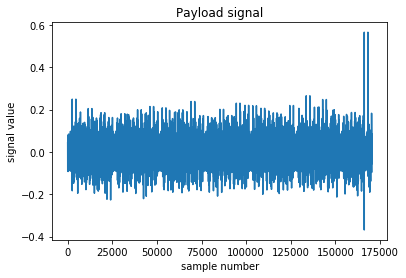

In [18]:
block_4 = np.array([np.fft.ifft(batch) for batch in block_4_symbol])
block_4 = np.array([np.append(batch[-L:], batch) for batch in block_4]).flatten()

assert block_4.shape[0]%(N+L) == 0

if np.imag(block_4).all() < 1e-8:
    block_4 = block_4.real
else:
    raise Exception

plt.plot(block_4)
plt.title("Payload signal")
plt.xlabel("sample number")
plt.ylabel("signal value")
plt.savefig("plots/4_payload")
plt.show()

5. Add reversed (?) chirp at the back 

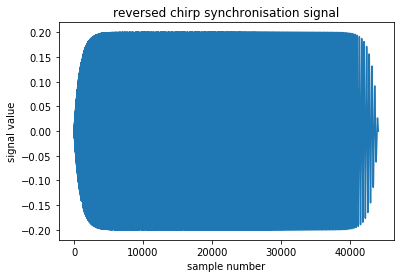

In [19]:
block_5 = block_1[::-1]

plt.plot(block_5)
plt.title("reversed chirp synchronisation signal")
plt.xlabel("sample number")
plt.ylabel("signal value")
plt.savefig("plots/5_reverse_chirp")
plt.show()

6. Combine all blocks

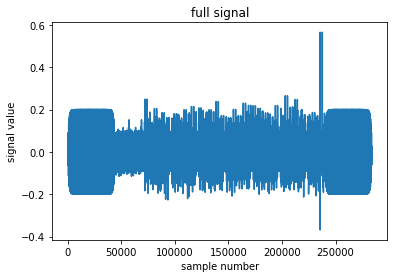

In [20]:
transmitted_signal = np.concatenate((block_1, block_2, block_3, block_4, block_5))
plt.plot(transmitted_signal)
plt.title("full signal")
plt.xlabel("sample number")
plt.ylabel("signal value")
plt.savefig("plots/full_signal")
plt.show()

wavfile.write("team_4_txt_10s.wav", 44100, transmitted_signal)
Audio(transmitted_signal, rate=44100)

A summary of standards shared with receivers:
- metadata length (200 bits)
- N = 2048
- L = 256
- n = 5
- repeats = 2
- pilot locations = np.arange(1, N//2-1, 8)
- pilot value = 1+1j
- mapping: gray coding (anticlockwise)
- random OFDM block values (block_3_symbol)
- OFDM preamble (file_random_2_bits)
- lower_freq_bin = 50
- upper_freq_bin = 700+1

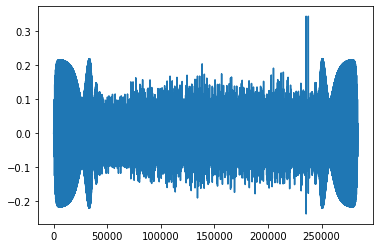

In [21]:
#Simulated
channel = pd.read_csv("channel.csv", header=None).values.flatten()
received_signal = signal.lfilter(channel, [1], transmitted_signal) + np.random.normal(0, 0, transmitted_signal.shape[0])
plt.plot(received_signal)
plt.show()

In [22]:
#Real channel
#Import the .wav file into a numpy array
S, received_signal = wavfile.read("group_2_real.wav")

received_signal = np.array(received_signal)
Audio(received_signal, rate=44100)

# Receiver (without phase correction)

1. Synchronisation

Matched filtering with reversed chirp and chirp for start and end of signal

In [23]:
#Matched filtering with reversed chirp (i.e. block 1)
mfil_signal_start = signal.correlate(received_signal, block_1, mode="full")

#Extract starting synchronisation point by finding maximum in matched filtered signal
mfil_start = np.where(abs(mfil_signal_start) == abs(np.max(mfil_signal_start)))[0][0] 

#Matched filtering with forward chirp (i.e. block 5)
mfil_signal_end = signal.correlate(received_signal, block_5, mode="full")

#Extract ending synchronisation point by finding maximum in matched filtered signal
mfil_end = np.where(abs(mfil_signal_end) == abs(np.max(mfil_signal_end)))[0][0] 

In [24]:
plt.plot(received_signal/max(abs(received_signal)), label = "received signal")
plt.plot(mfil_signal_start/max(abs(mfil_signal_start)), "y", label = "reversed chirp matched filtering")
plt.plot(mfil_signal_end/max(abs(mfil_signal_end)), "r", label = "reversed chirp matched filtering") 
plt.title("reversed chirp matched filtering")
plt.xlabel("sample number")
plt.ylabel("signal value")
plt.legend()
plt.savefig("plots/matched_filtering")
plt.show()

/Users/adamloi/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  


KeyboardInterrupt: 

1.1 Check consistency of sampling rates

In [25]:
received_length = mfil_end - mfil_start
print()

sampling_mismatch = (received_length - block_2.shape[0] - block_3.shape[0] - block_5.shape[0])%(N+L)
print(sampling_mismatch)


5


2. Channel estimation and resynchronisation

/Users/adamloi/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: divide by zero encountered in true_divide
  
/Users/adamloi/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  
/Users/adamloi/opt/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:151: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims)
/Users/adamloi/opt/anaconda3/lib/python3.7/site-packages/numpy/core/_asarray.py:85: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


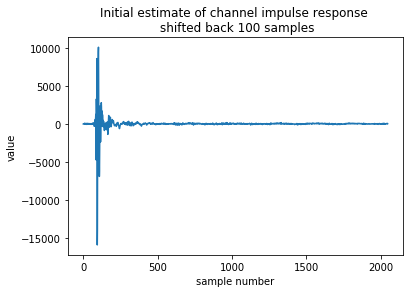

/Users/adamloi/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:48: RuntimeWarning: divide by zero encountered in true_divide
/Users/adamloi/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in true_divide


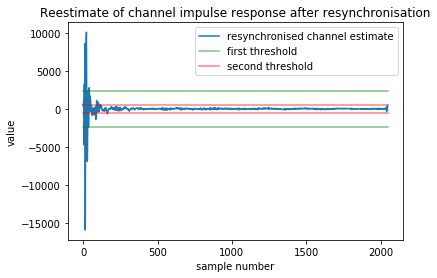

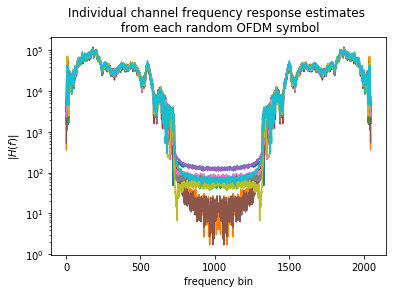

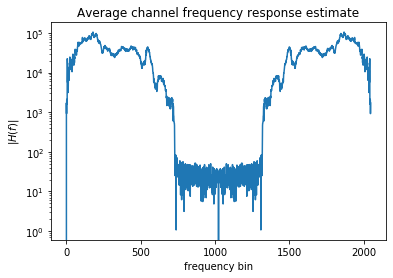

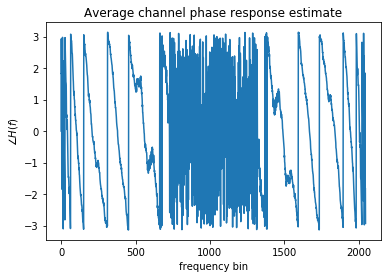

In [26]:
#simulated time shift tau
tau = 0

#Take about 100 samples before sync point and reestimate sync point
est_signal_start = mfil_start - 100
est_signal_end = mfil_end - 100
raw_signal = received_signal[est_signal_start:]

received_block_3 = raw_signal[block_2.shape[0]: block_2.shape[0]+block_3.shape[0]].reshape(-1, N+L)
received_block_3 = received_block_3[:, L:]

received_block_3_symbols = [np.fft.fft(batch) for batch in received_block_3]

H_block = np.array([batchY/batchX for batchY, batchX in zip(received_block_3_symbols, block_3_symbol)])
H_est = np.mean(H_block, axis=0)
H_est[np.isnan(H_est)]=0
H_est[np.isinf(H_est)]=0

#normalise h_est to estimate sync point
h_est = np.fft.ifft(H_est)
h_est = h_est

plt.plot(h_est)
plt.title("Initial estimate of channel impulse response \n shifted back 100 samples")
plt.xlabel("sample number")
plt.ylabel("value")
plt.savefig("plots/resynchronisation_1")
plt.show()

#Thresholding from double standard deviation thresholding
threshold1 = 3*np.std(h_est)
noisy = h_est[abs(h_est)<threshold1]
threshold2 = 3*np.std(noisy)

#sync point estimated where channel response begins (spikes)
shift_sync = np.where(abs(h_est)>threshold2)[0][0] + tau
signal_start = est_signal_start + shift_sync 
signal_end = est_signal_end + shift_sync

raw_signal = received_signal[signal_start:signal_end]

#recalculate channel response
received_block_3 = raw_signal[block_2.shape[0]: block_2.shape[0]+block_3.shape[0]].reshape(-1, N+L)
received_block_3 = received_block_3[:, L:]

received_block_3_symbols = [np.fft.fft(batch) for batch in received_block_3]

H_block = np.array([batchY/batchX for batchY, batchX in zip(received_block_3_symbols, block_3_symbol)])
H_est = np.mean(H_block, axis=0)
H_est[np.isnan(H_est)]=0
H_est[np.isinf(H_est)]=0
h_est = np.fft.ifft(H_est)

#Plotting
plt.plot(h_est, label = "resynchronised channel estimate")
x = [0, h_est.shape[0]]
plt.plot(x, [threshold1, threshold1], "g", alpha = 0.5)
plt.plot(x, [-threshold1, -threshold1], "g", alpha = 0.5, label = "first threshold")
plt.plot(x, [threshold2, threshold2], "r", alpha = 0.5)
plt.plot(x, [-threshold2, -threshold2], "r", alpha = 0.5, label = "second threshold")
plt.title("Reestimate of channel impulse response after resynchronisation")
plt.xlabel("sample number")
plt.ylabel("value")
plt.legend()
plt.savefig("plots/resynchronisation_2")
plt.show()

plt.plot(abs(H_block).transpose())
plt.yscale("log")
plt.title("Individual channel frequency response estimates \n from each random OFDM symbol")
plt.xlabel("frequency bin")
plt.ylabel("$|H(f)|$")
plt.savefig("plots/frequency_response_all")
plt.show()

plt.plot(abs(H_est))
plt.yscale("log")
plt.title("Average channel frequency response estimate")
plt.xlabel("frequency bin")
plt.ylabel("$|H(f)|$")
plt.savefig("plots/frequency_response_avg")
plt.show()

plt.plot(np.angle(H_est))
plt.title("Average channel phase response estimate")
plt.xlabel("frequency bin")
plt.ylabel("$\\angle H(f)$")
plt.savefig("plots/phase_response_avg")
plt.show()

3. Getting back the file

Get block 4 symbols (equalised)

In [27]:
#Get block 4 (file block)
#Define a margin at the end to account for inaccuracies in signal end
end_margin = 100
block_4_start = block_2.shape[0]+block_3.shape[0]
block_4_end = -block_5.shape[0]+end_margin

assert block_4_end < 0

received_block_4 = raw_signal[block_4_start: block_4_end]

#Estimate number of N+L length "chunks" in block 4 using 
num_chunks = received_block_4.shape[0]//(N+L)
print(num_chunks)

received_block_4 = received_block_4[:num_chunks*(N+L)].reshape(-1, N+L)
received_block_4_wo_cyclic = received_block_4[:, L:]
received_block_4_symbol = np.array([np.fft.fft(batch) for batch in received_block_4_wo_cyclic])
equalised_block_4 = received_block_4_symbol/H_est

#Remove preambles
del_inds = np.arange(0, received_block_4_symbol.shape[0], 11)
cleaned_block_4 = np.delete(equalised_block_4, del_inds, 0)

1461


/Users/adamloi/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in true_divide
/Users/adamloi/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide


3.1 Without phase correction

- Remove unused bins and pilot symbols
- LDPC decoding

(1328, 569)


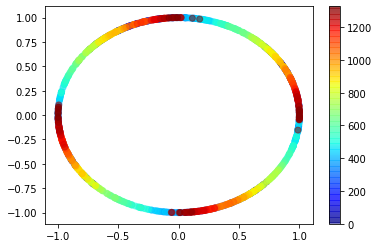

array([1, 0, 3, 0, 1, 0, 3, 0, 1, 0, 3, 0, 1, 0, 3, 0, 1, 0, 3, 0, 0, 0,
       0, 0, 0, 0, 3, 2, 3, 0, 0, 3, 0, 1, 3, 0, 0, 0, 0, 0, 0, 0, 3, 2,
       3, 0, 0, 3, 0, 1, 3, 0, 0, 0, 0, 0, 0, 0, 3, 2, 3, 0, 0, 3, 0, 1,
       3, 0, 0, 0, 0, 0, 0, 0, 3, 2, 3, 0, 0, 3, 0, 1, 3, 0, 0, 0, 0, 0,
       0, 0, 3, 2, 3, 0, 0, 3, 0, 1, 3, 0])

In [28]:
#Remove unused bins
file_block = cleaned_block_4[:, lower_freq_bin:upper_freq_bin]

#Remove pilot tones
pilot_tones_inds_in_file = pilot_tones_inds[pilot_tones_inds>=lower_freq_bin]
pilot_tones_inds_in_file = pilot_tones_inds_in_file[pilot_tones_inds_in_file<upper_freq_bin]
pilot_tones_inds_in_file = pilot_tones_inds_in_file-lower_freq_bin

file_block = np.delete(file_block, pilot_tones_inds_in_file, 1)
print(file_block.shape)
plot_angle = np.angle(file_block[:, 100].flatten())
plt.scatter(np.cos(plot_angle), np.sin(plot_angle), c = np.arange(plot_angle.shape[0]), cmap="jet", alpha=0.5)
plt.colorbar()
plt.show()

((np.rint((np.angle(file_block)-np.pi/4)/(np.pi/2)))%4).flatten()[:100].astype(int)

In [29]:
def LLR_calc(file_block, H_est, noise_var):
    #noise_var is the raw unequalised noise variance
    #equalised is the equalised received data (matrix form) with cyclic prefix removed
    #H_est is the estimated channel response
    #This code calculates the LLR of the received bits. The LLR will then be passed into
    #Jossy's ldpc code which will do message passing for error correction
    
    #constants in LLR calculation
    const = abs(H_est)**2*np.sqrt(2)/noise_var
    
    LLR = []
    for freq in file_block:
        for i in range(freq.shape[0]):
            L1 = const[i]*np.imag(freq[i])
            L2 = const[i]*np.real(freq[i])
            LLR.append(L1)
            LLR.append(L2)
    LLR = np.array(LLR)
    return LLR

In [34]:
#Decode LDPC
H = H_est[lower_freq_bin:upper_freq_bin]
H = np.delete(H, pilot_tones_inds_in_file, 0)
LLR = LLR_calc(file_block, H, 0.01)
print(LLR)
print(LLR.shape)
LLR = LLR[:LLR.shape[0] - LLR.shape[0]%c.N]
print(LLR.shape)
LLR = LLR.reshape(-1, c.N)
print(LLR.shape)

ldpc_decoded = []
for batch in LLR:
    c = ldpc.code(standard="802.11n", rate="1/2", z=81, ptype="A")
    app, it = c.decode(batch)
    ldpc_decoded.append(app[:c.K])
ldpc_decoded = np.array(ldpc_decoded)
print(ldpc_decoded)
print(ldpc_decoded.shape)
ldpc_decoded = ldpc_decoded.flatten()
print(ldpc_decoded.shape)
print(it)
received_bits = np.array(*[ldpc_decoded<0], dtype=int)
print(received_bits)

[ 8.40840226e+10 -6.83670140e+10  6.43216455e+10 ...  2.08040016e+09
 -1.88183536e+09  8.86064432e+07]
(1511264,)
(1510488,)
(777, 1944)
[[ 9.17872136e+11 -9.72957919e+11  9.94608132e+11 ... -3.61682129e+11
  -3.67994770e+11 -4.23719554e+11]
 [ 1.30287387e+12 -1.31134924e+12  1.33619642e+12 ...  6.46006667e+11
  -6.77875586e+11  5.74784214e+11]
 [ 4.59965597e+11 -4.53637624e+11 -4.63060804e+11 ... -6.86867783e+11
  -9.13557796e+11 -9.18555576e+11]
 ...
 [-2.88655593e+12  7.18398559e+12  1.32667136e+12 ...  1.12885169e+12
  -3.50556867e+12 -1.16320524e+12]
 [-2.31521303e+11  9.76436602e+11 -1.88533907e+11 ...  2.36821436e+11
  -3.88627666e+11  7.93744459e+11]
 [ 9.58500788e+11  1.16896690e+12 -5.92680607e+11 ...  7.31490360e+11
  -5.19573387e+11  1.04927942e+12]]
(777, 972)
(755244,)
200
[0 1 0 ... 0 1 0]


In [35]:
def decode_metadata(received_bits):
    type_bytes = 1
    type_repeats = 5
    size_bytes = 4
    size_repeats = 5

    size_bits_number = size_bytes*size_repeats*8
    type_bits_number = type_bytes*type_repeats*8

    type_bits, size_bits, content_bits = np.split(received_bits, [type_bits_number, size_bits_number+type_bits_number])
    size_bits = size_bits.reshape((size_repeats, -1))
    size_bits_voted = np.array([0 if x<0.5 else 1 for x in np.mean(size_bits, axis=0)])

    file_size = int("".join([str(i) for i in size_bits_voted]), 2)

    file_type_options = {'tif': [0,0,1,1,0,0,1,0], 'txt': [0,1,0,0,1,0,0,0], 'wav': [1,0,1,0,0,1,0,1]}
    type_bits = type_bits.reshape(-1, 8)
    file_types = []
    ham_dists = []
    for key, value in file_type_options.items():
        ham_dists.append(np.sum([np.subtract(batch, value)%2 for batch in type_bits]))
        file_types.append(key)
    file_type = file_types[np.argmin(ham_dists)]
    print(ham_dists)

    content_bits = content_bits[:file_size]

    return file_size, file_type, content_bits

In [36]:
file_size, file_type, content_bits = decode_metadata(received_bits)
print(file_size)
print(file_type)
print(content_bits)

[25, 0, 30]
754200
txt
[0 1 0 ... 0 1 0]


In [37]:
#Demapping
def get_file_from_bits(file_size, file_type, content_bits):
    received_bytes = np.packbits(content_bits[:file_size])

    received_bytes = bytearray(received_bytes)    
    
    if file_type == "txt":
        print("".join([chr(byte) for byte in received_bytes[:1000]]))
        print("".join([chr(byte) for byte in received_bytes[-1000:]]))
        with open('output_text.txt', 'wb') as file:
            file.write(received_bytes)
        return None

    if file_type == "tif":
        print(received_bytes[:400])
        print("".join([chr(byte) for byte in received_bytes[:5000]]))
        with open('output_image.tiff', 'wb') as file:
            file.write(received_bytes)
        return None

    if file_type == "wav":
        with open('output_audio.wav', 'wb') as file:
            file.write(received_bytes)
            
    Audio(received_audio, rate=44100)

In [38]:
get_file_from_bits(file_size, file_type, content_bits)

THE SONNETS

by William Shakespeare

From fairest creatures we desire increase,
That thereby beauty's rose might never die,
But as the riper should by time decease,
His tender heir might bear his memory:
But thou contracted to thine own bright eyes,
Feed'st thy light's flame with self-substantial fuel,
Making a famine where abundance lies,
Thy self thy foe, to thy sweet self too cruel:
Thou that art now the world's fresh ornament,
And only herald to the gaudy spring,
Within thine own bud buriest thy content,
And tender churl mak'st waste in niggarding:
Pity the world, or else this glutton be,
To eat the world's due, by the grave and thee.

When forty winters shall besiege thy brow,
And dig deep trenches in thy beauty's field,
Thy youth's proud livery so gazed on now,
Will be a tattered weed of small worth held:  
Then being asked, where all thy beauty lies,
Where all the treasure of thy lusty days;
To say within thine own deep sunken eyes,
Were an all-eating shame, and thriftless prais

In [39]:
def print_BER(file_block, received_bits):
    mapping = {(0, 0): (1+1j), (0, 1): (-1+1j), (1, 1): (-1-1j), (1, 0): (1-1j)}
    file_block_flatten = file_block.flatten()
    bits = []
    for j in range(file_block_flatten.shape[0]):
        bit1, bit2 = min(mapping, key=lambda k: abs(file_block_flatten[j] - mapping[k]))
        bits.append([bit1, bit2])
    bits = np.array(bits).flatten()
    
    c = ldpc.code(standard="802.11n", rate="1/2", z=81, ptype="A")
    received = np.array([c.encode(batch) for batch in received_bits.reshape(-1, c.K)]).flatten()
    print([bits[:received.shape[0]]!=received])
    BER = np.sum([bits[:received.shape[0]]!=received])/bits.shape[0]
    print(BER)

In [40]:
print_BER(file_block, received_bits)

[array([False, False, False, ...,  True, False,  True])]
0.32129131640798697


# Receiver (with phase correction)

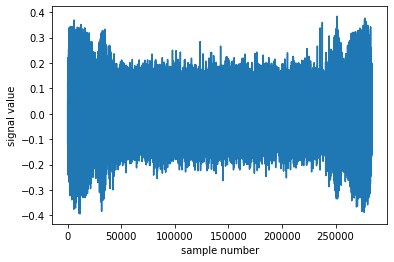

In [41]:
#Simulated
channel = pd.read_csv("channel.csv", header=None).values.flatten()
received_signal = signal.lfilter(channel, [1], transmitted_signal) + np.random.normal(0, 0.05, transmitted_signal.shape[0])
plt.plot(received_signal)
plt.xlabel("sample number")
plt.ylabel("signal value")
plt.savefig("plots/received_sim")
plt.show()

In [30]:
#Simulate resampling
#received_signal = signal.resample(received_signal, received_signal.shape[0]-5)

In [54]:
#Real channel
#Import the .wav file into a numpy array
S, received_signal = wavfile.read("group_test.wav")

received_signal = np.array(received_signal)
Audio(received_signal, rate=44100)

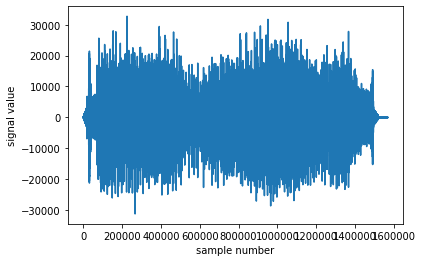

In [55]:
plt.plot(received_signal)
plt.xlabel("sample number")
plt.ylabel("signal value")
plt.savefig("plots/real_signal")
plt.show()

1. Synchronisation

In [56]:
#Matched filtering with reversed chirp (i.e. block 1)
mfil_signal_start = signal.correlate(received_signal, block_1, mode="full")

#Extract starting synchronisation point by finding maximum in matched filtered signal
mfil_start = np.where(abs(mfil_signal_start) == abs(np.max(mfil_signal_start)))[0][0] 

#Matched filtering with forward chirp (i.e. block 5)
mfil_signal_end = signal.correlate(received_signal, block_5, mode="full")

#Extract ending synchronisation point by finding maximum in matched filtered signal
mfil_end = np.where(abs(mfil_signal_end) == abs(np.max(mfil_signal_end)))[0][0] 

/Users/adamloi/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  import sys


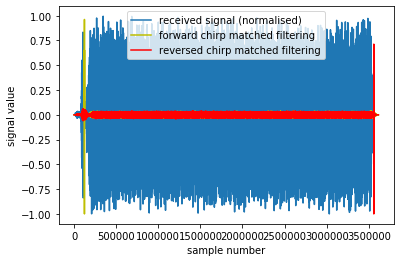

In [54]:
plt.plot(received_signal/max(abs(received_signal)), label="received signal (normalised)")
plt.plot(mfil_signal_start/max(abs(mfil_signal_start)), "y", label="forward chirp matched filtering")
plt.plot(mfil_signal_end/max(abs(mfil_signal_end)), "r", label="reversed chirp matched filtering")      
plt.xlabel("sample number")
plt.ylabel("signal value")
plt.legend()
plt.savefig("plots/mfil_sim")
plt.show()

2. Channel estimation and resynchronisation

/Users/adamloi/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: divide by zero encountered in true_divide
  
/Users/adamloi/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


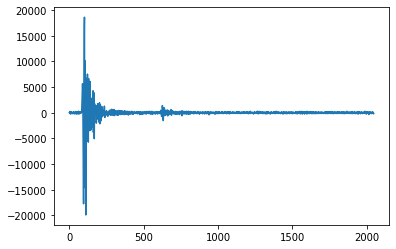

/Users/adamloi/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:42: RuntimeWarning: divide by zero encountered in true_divide
/Users/adamloi/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:42: RuntimeWarning: invalid value encountered in true_divide


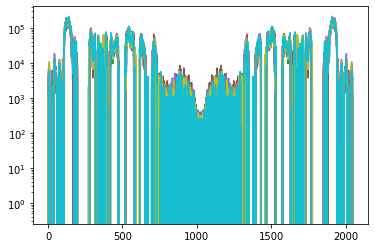

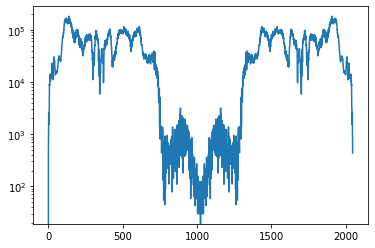

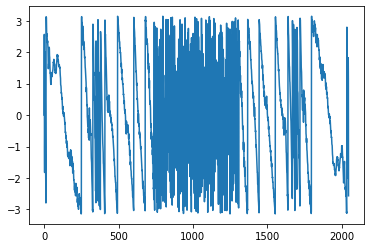

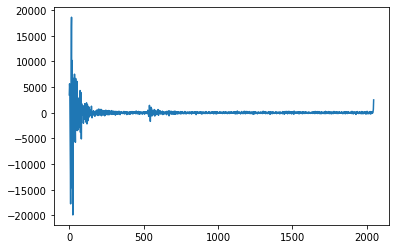

In [58]:
#simulated time shift tau
tau = 0

#Take about 100 samples before sync point and reestimate sync point
est_signal_start = mfil_start - 100
est_signal_end = mfil_end - 100
raw_signal = received_signal[est_signal_start:]

received_block_3 = raw_signal[block_2.shape[0]: block_2.shape[0]+block_3.shape[0]].reshape(-1, N+L)
received_block_3 = received_block_3[:, L:]

received_block_3_symbols = [np.fft.fft(batch) for batch in received_block_3]

H_block = np.array([batchY/batchX for batchY, batchX in zip(received_block_3_symbols, block_3_symbol)])
H_est = np.mean(H_block, axis=0)
H_est[np.isnan(H_est)]=0
H_est[np.isinf(H_est)]=0

#normalise h_est to estimate sync point
h_est = np.fft.ifft(H_est)
h_est = h_est

plt.plot(h_est)
plt.show()

threshold1 = 3*np.std(h_est)
thresholded = h_est[h_est<threshold1]
threshold2 = 3*np.std(thresholded)
#sync point estimated where channel response begins (spikes)
shift_sync = np.where(abs(h_est)>threshold2)[0][0] + tau
signal_start = est_signal_start + shift_sync 
signal_end = est_signal_end + shift_sync

raw_signal = received_signal[signal_start:signal_end]

#recalculate channel response
received_block_3 = raw_signal[block_2.shape[0]: block_2.shape[0]+block_3.shape[0]].reshape(-1, N+L)
received_block_3 = received_block_3[:, L:]

received_block_3_symbols = [np.fft.fft(batch) for batch in received_block_3]

H_block = np.array([batchY/batchX for batchY, batchX in zip(received_block_3_symbols, block_3_symbol)])
H_est = np.mean(H_block, axis=0)
H_est[np.isnan(H_est)]=0
H_est[np.isinf(H_est)]=0
h_est = np.fft.ifft(H_est)

plt.plot(H_block.transpose())
plt.yscale("log")
plt.show()
plt.plot(abs(H_est))
plt.yscale("log")
plt.show()
plt.plot(np.angle(H_est))
plt.show()
plt.plot(h_est)
plt.show()

3. Getting back the file

In [59]:
#Get block 4 (file block)
#Define a margin at the end to account for inaccuracies in signal end
end_margin = 100
block_4_start = block_2.shape[0]+block_3.shape[0]
block_4_end = -block_5.shape[0]+end_margin

assert block_4_end < 0

received_block_4 = raw_signal[block_4_start: block_4_end]

#Estimate number of N+L length "chunks" in block 4 using 
num_chunks = received_block_4.shape[0]//(N+L)
print(num_chunks)

received_block_4 = received_block_4[:num_chunks*(N+L)].reshape(-1, N+L)
received_block_4_wo_cyclic = received_block_4[:, L:]
received_block_4_symbol = np.array([np.fft.fft(batch) for batch in received_block_4_wo_cyclic])
equalised_block_4 = received_block_4_symbol/H_est

#Remove preambles
del_inds = np.arange(0, received_block_4_symbol.shape[0], 11)
cleaned_block_4 = np.delete(equalised_block_4, del_inds, 0)

612


/Users/adamloi/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in true_divide
/Users/adamloi/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide


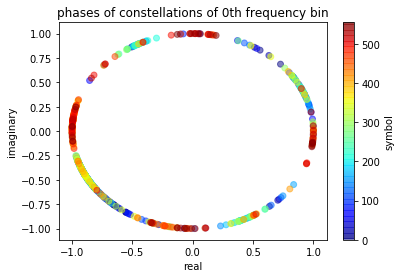

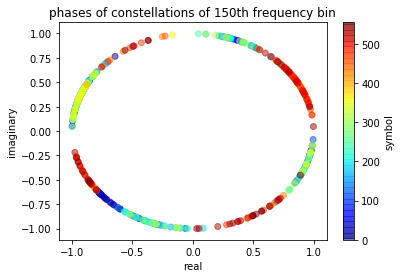

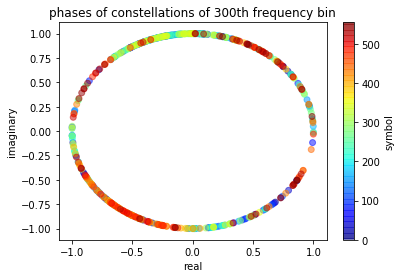

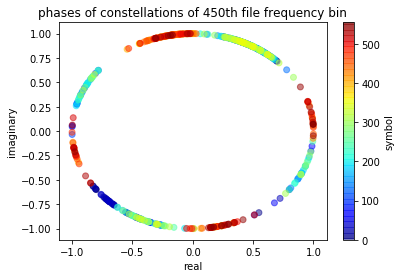

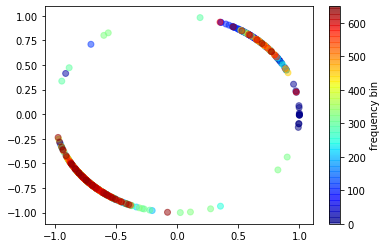

In [60]:
#Remove unused bins
file_block = cleaned_block_4[:, lower_freq_bin:upper_freq_bin]

#Get pilot tones (within used bins)
pilot_tones_inds_in_file = pilot_tones_inds[pilot_tones_inds>=lower_freq_bin]
pilot_tones_inds_in_file = pilot_tones_inds_in_file[pilot_tones_inds_in_file<upper_freq_bin]
pilot_tones_inds_in_file = pilot_tones_inds_in_file-lower_freq_bin

pilot_tones = np.array([file_block[:, i] for i in pilot_tones_inds_in_file]).transpose()

#Plots to visualise shifting
plot_angle = np.angle(file_block[:, 0])
plt.scatter(np.cos(plot_angle), np.sin(plot_angle), c = np.arange(plot_angle.shape[0]), cmap="jet", alpha=0.5)
clb = plt.colorbar()
clb.set_label("symbol")
plt.title("phases of constellations of 0th frequency bin")
plt.xlabel("real")
plt.ylabel("imaginary")
plt.savefig("plots/phase_shift_1")
plt.show()

plot_angle = np.angle(file_block[:, 150])
plt.scatter(np.cos(plot_angle), np.sin(plot_angle), c = np.arange(plot_angle.shape[0]), cmap="jet", alpha=0.5)
clb = plt.colorbar()
clb.set_label("symbol")
plt.title("phases of constellations of 150th frequency bin")
plt.xlabel("real")
plt.ylabel("imaginary")
plt.savefig("plots/phase_shift_2")
plt.show()

plot_angle = np.angle(file_block[:, 300])
plt.scatter(np.cos(plot_angle), np.sin(plot_angle), c = np.arange(plot_angle.shape[0]), cmap="jet", alpha=0.5)
clb = plt.colorbar()
clb.set_label("symbol")
plt.title("phases of constellations of 300th frequency bin")
plt.xlabel("real")
plt.ylabel("imaginary")
plt.savefig("plots/phase_shift_3")
plt.show()

plot_angle = np.angle(file_block[:, 450])
plt.scatter(np.cos(plot_angle), np.sin(plot_angle), c = np.arange(plot_angle.shape[0]), cmap="jet", alpha=0.5)
clb = plt.colorbar()
clb.set_label("symbol")
plt.title("phases of constellations of 450th file frequency bin")
plt.xlabel("real")
plt.ylabel("imaginary")
plt.savefig("plots/phase_shift_4")
plt.show()

plot_angle = np.angle(file_block[10, :])
plt.scatter(np.cos(plot_angle), np.sin(plot_angle), c = np.arange(plot_angle.shape[0]), cmap="jet", alpha=0.5)
clb = plt.colorbar()
clb.set_label("frequency bin")
plt.show()

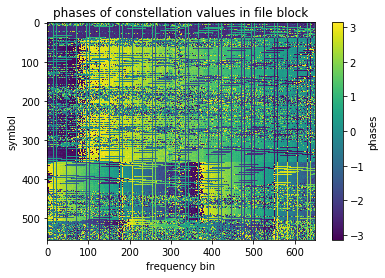

In [61]:
plt.imshow(np.angle(file_block), interpolation="nearest", aspect="auto")
plt.title("phases of constellation values in file block")
clb = plt.colorbar()
clb.set_label("phases")
plt.xlabel("frequency bin")
plt.ylabel("symbol")
plt.savefig("plots/raw_phase_plot")
plt.show()

In [45]:
#Pilot tones phase mismatch
pilot_tones_val = 1+1j
pilot_phase_mismatch = np.angle(pilot_tones) - np.angle(pilot_tones_val)

In [46]:
#Unwrapping function
def phase_unwrap(phase_array):
    #Input 2D array
    phases = phase_array.copy()
    phases_diff = np.array([phases[i+1] - phases[i] for i in range(phases.shape[0]-1)])

    #Get start and end points of each smooth section
    discont = np.array(*np.where(abs(phases_diff)>=1.5*np.pi))
    sign = np.sign(np.array([phases_diff[i] for i in discont]))
    
    offset = 0
    for i, j in zip(discont, sign):
        phases[:i+1] += j*(2*np.pi)
        offset += j*2*np.pi
    phases -= offset

    return phases

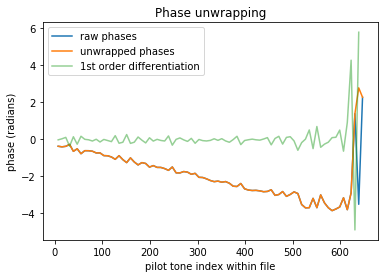

In [53]:
#Demonstration of unwrapping function
plot_ind = 402
phases = pilot_phase_mismatch[plot_ind].copy()
phases_diff = np.array([phases[i+1] - phases[i] for i in range(phases.shape[0]-1)])

discont = np.array(*np.where(abs(phases_diff)>=1.5*np.pi))
sign = np.sign(np.array([phases_diff[i] for i in discont]))

offset = 0
for i, j in zip(discont, sign):
    phases[:i+1] += j*(2*np.pi)
    offset += j*2*np.pi
phases -= offset

plt.plot(pilot_tones_inds_in_file, pilot_phase_mismatch[plot_ind], label = "raw phases")
plt.plot(pilot_tones_inds_in_file, phases, label = "unwrapped phases")
plt.plot(pilot_tones_inds_in_file[:-1], phases_diff, alpha=0.5, label = "1st order differentiation")
plt.title("Phase unwrapping")
plt.ylabel("phase (radians)")
plt.xlabel("pilot tone index within file")
plt.legend()
plt.savefig("plots/phase_unwrapping")
plt.show()

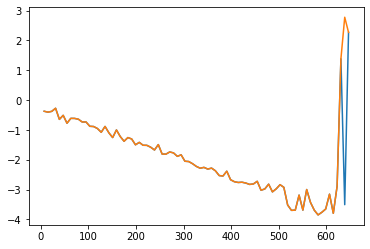

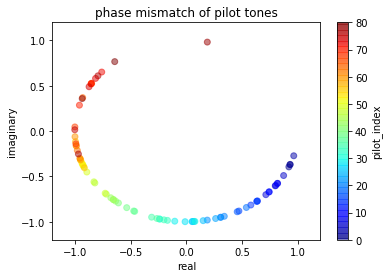

In [52]:
#Unwrapping
pilot_phase_mismatch_unwrap = np.array([phase_unwrap(batch) for batch in pilot_phase_mismatch])

plot_ind = 402
plt.plot(pilot_tones_inds_in_file, pilot_phase_mismatch[plot_ind])
plt.plot(pilot_tones_inds_in_file, pilot_phase_mismatch_unwrap[plot_ind])
plt.show()

plt.scatter(np.cos(pilot_phase_mismatch[plot_ind]), np.sin(pilot_phase_mismatch[plot_ind]), c = np.arange(pilot_phase_mismatch[plot_ind].shape[0]), cmap="jet", alpha=0.5)
plt.title("phase mismatch of pilot tones")
clb = plt.colorbar()
clb.set_label("pilot_index")
plt.xlim(-1.2, 1.2)
plt.ylim(-1.2, 1.2)
plt.xlabel("real")
plt.ylabel("imaginary")
plt.savefig("plots/pilot_tones_phase_mismatch")
plt.show()

In [73]:
#Linear regression function
def get_grad_and_intercept(unwrapped_phases):
    #Input: 1D array
    phases = unwrapped_phases.copy()
    reg = LinearRegression().fit(pilot_tones_inds_in_file.reshape(-1, 1), phases)
    gradient, intercept = (reg.coef_, reg.intercept_)
    
    return gradient.flatten(), intercept.flatten()

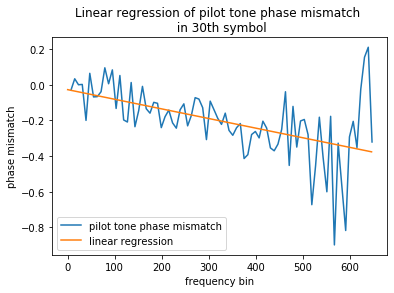

In [74]:
#Linear regression wrt frequency (time shift) demonstration
plot_ind = 30
gradient, intercept = get_grad_and_intercept(pilot_phase_mismatch_unwrap[plot_ind])

plt.plot(pilot_tones_inds_in_file, pilot_phase_mismatch_unwrap[plot_ind], label = "pilot tone phase mismatch")

x = np.arange(pilot_tones_inds_in_file[-1])
plt.plot(x, gradient*x+intercept, label = "linear regression")
plt.title("Linear regression of pilot tone phase mismatch \n in {}th symbol".format(plot_ind))
plt.xlabel("frequency bin")
plt.ylabel("phase mismatch")
plt.legend()
plt.savefig("plots/linregress_symbol")
plt.show()

In [75]:
#First Linear regression: across frequency
gradients = []
intercepts = []
for batch in pilot_phase_mismatch_unwrap:
    gradient, intercept = get_grad_and_intercept(batch)
    gradients.append(*gradient)
    intercepts.append(*intercept)
gradients = np.array(gradients)
intercepts = np.array(intercepts)

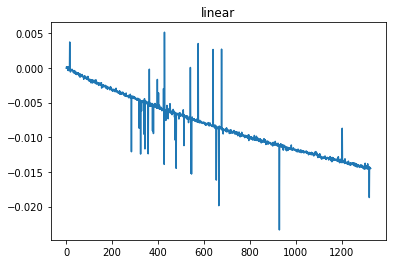

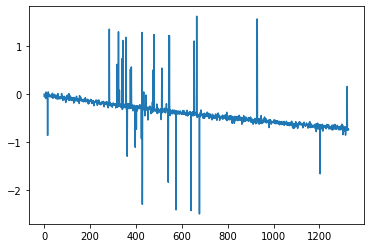

In [76]:
plt.plot(gradients)
plt.title("linear")
plt.show()
plt.plot(intercepts)
plt.show()

[-1.48653411e-05  3.20480531e-09] -0.00025131638674541663
[-6.54976031e-04  8.74919069e-08] -0.010508768952030956


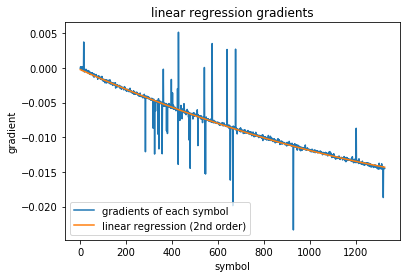

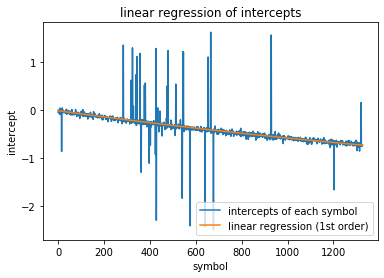

In [77]:
#Second order second linear regression: across symbols
x = np.arange(gradients.shape[0]).reshape(-1, 1)
X = np.array([[*xi, *xi**2] for xi in x])
reg = LinearRegression().fit(X, gradients)
grad_gradient, grad_intercept = (reg.coef_, reg.intercept_)

reg = LinearRegression().fit(X, intercepts)
inter_gradient, inter_intercept = (reg.coef_, reg.intercept_)
print(grad_gradient, grad_intercept)
print(inter_gradient, inter_intercept)

x = np.arange(gradients.shape[0])
plt.plot(x, gradients, label = "gradients of each symbol")
plt.plot(x, np.sum(grad_gradient*X, axis=1) + grad_intercept, label = "linear regression (2nd order)")
plt.title("linear regression gradients")
plt.xlabel("symbol")
plt.ylabel("gradient")
plt.legend()
plt.savefig("plots/linregress_grad")
plt.show()

plt.plot(x, intercepts, label = "intercepts of each symbol")
plt.plot(x, np.sum(inter_gradient*X, axis=1) + inter_intercept, label = "linear regression (1st order)")
plt.title("linear regression of intercepts")
plt.xlabel("symbol")
plt.ylabel("intercept")
plt.legend()
plt.savefig("plots/linregress_inter")
plt.show()

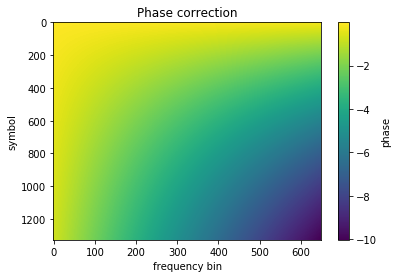

In [78]:
#Get phase correction needed
#We have these variables:
#grad_gradient
#grad_intercept
#inter_gradient
#inter_intercept
x = np.arange(upper_freq_bin-lower_freq_bin)
Y = X
phase_correction = []
for Yi in Y:
    batch_phase_correction = (grad_gradient.dot(Yi) + grad_intercept)*x + (inter_gradient.dot(Yi) + inter_intercept)
    phase_correction.append(batch_phase_correction)
phase_correction = np.array(phase_correction)
plt.imshow(phase_correction, interpolation="nearest", aspect="auto")
plt.title("Phase correction")
clb = plt.colorbar()
clb.set_label("phase")
plt.xlabel("frequency bin")
plt.ylabel("symbol")
plt.savefig("plots/phase_correction")
plt.show()

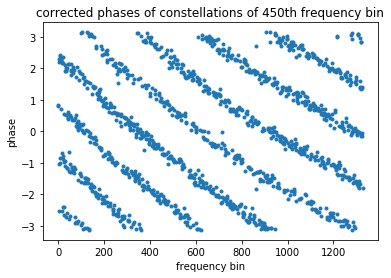

In [79]:
plt.plot(np.angle(file_block[:, 450]), ".")
plt.title("corrected phases of constellations of 450th frequency bin")
plt.xlabel("frequency bin")
plt.ylabel("phase")
plt.savefig("plots/phases_frequency450_scatter")
plt.show()

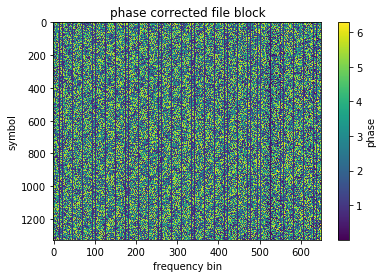

In [80]:
#Correct phase
file_block_corrected = (np.angle(file_block) - phase_correction)%(2*np.pi)
plt.imshow(file_block_corrected, interpolation="nearest", aspect="auto")
plt.title("phase corrected file block")
clb = plt.colorbar()
clb.set_label("phase")
plt.xlabel("frequency bin")
plt.ylabel("symbol")
plt.savefig("plots/corrected_phase")
plt.show()

(1328, 569)


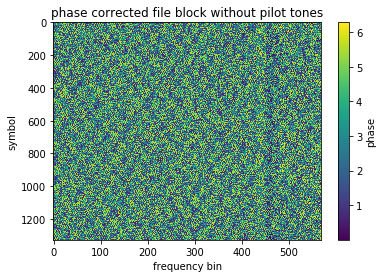

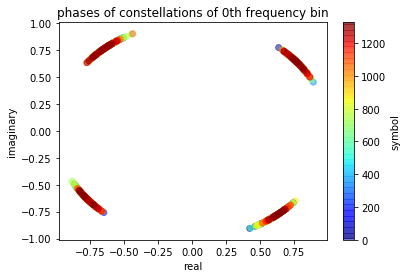

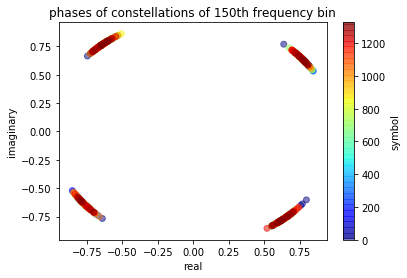

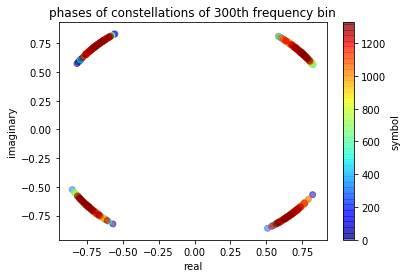

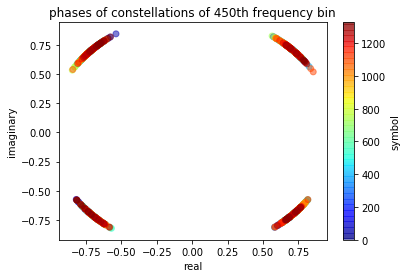

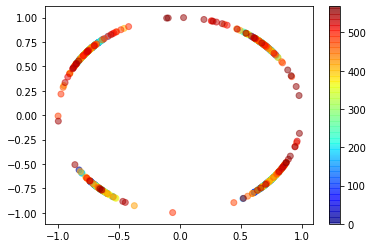

In [95]:
#Remove pilot tones
file_block_corrected_wo_pilots = np.delete(file_block_corrected, pilot_tones_inds_in_file, 1)
print(file_block_corrected_wo_pilots.shape)

plt.imshow(file_block_corrected_wo_pilots, interpolation="nearest", aspect="auto")
plt.title("phase corrected file block without pilot tones")
clb = plt.colorbar()
clb.set_label("phase")
plt.xlabel("frequency bin")
plt.ylabel("symbol")
plt.savefig("plots/corrected_phase_wo_pilot")
plt.show()

plot_angle = file_block_corrected_wo_pilots[:, 0]
plt.scatter(np.cos(plot_angle), np.sin(plot_angle), c = np.arange(plot_angle.shape[0]), cmap="jet", alpha=0.5)
clb = plt.colorbar()
clb.set_label("symbol")
plt.title("phases of constellations of 0th frequency bin")
plt.xlabel("real")
plt.ylabel("imaginary")
plt.savefig("plots/corrected_phase_shift_1")
plt.show()

plot_angle = file_block_corrected_wo_pilots[:, 150]
plt.scatter(np.cos(plot_angle), np.sin(plot_angle), c = np.arange(plot_angle.shape[0]), cmap="jet", alpha=0.5)
clb = plt.colorbar()
clb.set_label("symbol")
plt.title("phases of constellations of 150th frequency bin")
plt.xlabel("real")
plt.ylabel("imaginary")
plt.savefig("plots/corrected_phase_shift_2")
plt.show()

plot_angle = file_block_corrected_wo_pilots[:, 300]
plt.scatter(np.cos(plot_angle), np.sin(plot_angle), c = np.arange(plot_angle.shape[0]), cmap="jet", alpha=0.5)
clb = plt.colorbar()
clb.set_label("symbol")
plt.title("phases of constellations of 300th frequency bin")
plt.xlabel("real")
plt.ylabel("imaginary")
plt.savefig("plots/corrected_phase_shift_3")
plt.show()

plot_angle = file_block_corrected_wo_pilots[:, 450]
plt.scatter(np.cos(plot_angle), np.sin(plot_angle), c = np.arange(plot_angle.shape[0]), cmap="jet", alpha=0.5)
clb = plt.colorbar()
clb.set_label("symbol")
plt.title("phases of constellations of 450th frequency bin")
plt.xlabel("real")
plt.ylabel("imaginary")
plt.savefig("plots/corrected_phase_shift_4")
plt.show()

plot_angle = file_block_corrected_wo_pilots[10, :]
plt.scatter(np.cos(plot_angle), np.sin(plot_angle), c = np.arange(plot_angle.shape[0]), cmap="jet", alpha=0.5)
plt.colorbar()
plt.show()

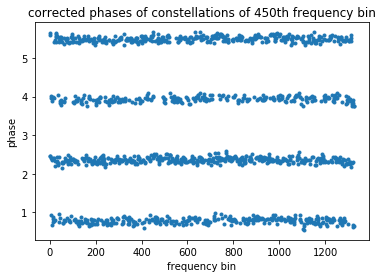

In [103]:
plt.plot(file_block_corrected_wo_pilots[:, 450], ".")
plt.title("corrected phases of constellations of 450th frequency bin")
plt.xlabel("frequency bin")
plt.ylabel("phase")
plt.savefig("plots/corrected_phases_frequency450_scatter")
plt.show()

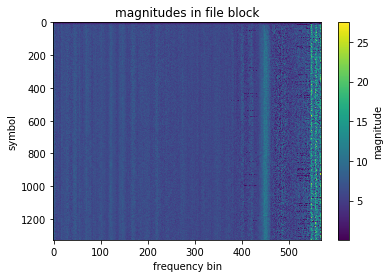

In [108]:
mag = abs(file_block)
mag = np.delete(mag, pilot_tones_inds_in_file, 1)

plt.imshow(mag, interpolation="nearest", aspect="auto")
plt.title("magnitudes in file block")
clb = plt.colorbar()
clb.set_label("magnitude")
plt.xlabel("frequency bin")
plt.ylabel("symbol")
plt.savefig("plots/mag_wo_pilots")
plt.show()

In [109]:
#LLR function
def LLR_calc(file_block, H_est, noise_var):
    #noise_var is the raw unequalised noise variance
    #equalised is the equalised received data (matrix form) with cyclic prefix removed
    #H_est is the estimated channel response
    #This code calculates the LLR of the received bits. The LLR will then be passed into
    #Jossy's ldpc code which will do message passing for error correction
    
    #constants in LLR calculation
    const = abs(H_est)**2*np.sqrt(2)/noise_var
    
    LLR = []
    for freq in file_block:
        for i in range(freq.shape[0]):
            L1 = const[i]*np.imag(freq[i])
            L2 = const[i]*np.real(freq[i])
            LLR.append(L1)
            LLR.append(L2)
    LLR = np.array(LLR)
    return LLR

In [111]:
LLR_input = np.array([np.cos(batch) + 1j*np.sin(batch) for batch in file_block_corrected_wo_pilots])
print(LLR_input.shape)
LLR_input = LLR_input*mag

#Decode LDPC
H = H_est[lower_freq_bin:upper_freq_bin]
H = np.delete(H, pilot_tones_inds_in_file, 0)
LLR = LLR_calc(LLR_input, H, 0.01)
print(LLR)
print(LLR.shape)
LLR = LLR[:LLR.shape[0] - LLR.shape[0]%c.N]
print(LLR.shape)
LLR = LLR.reshape(-1, c.N)
print(LLR.shape)

ldpc_decoded = []
for batch in LLR:
    c = ldpc.code(standard="802.11n", rate="1/2", z=81, ptype="A")
    app, it = c.decode(batch)
    ldpc_decoded.append(app[:c.K])
ldpc_decoded = np.array(ldpc_decoded)
print(ldpc_decoded)
print(ldpc_decoded.shape)
ldpc_decoded = ldpc_decoded.flatten()
print(ldpc_decoded.shape)
print(it)
received_bits = np.array(*[ldpc_decoded<0], dtype=int)
print(received_bits)

(1328, 569)
[ 8.42900545e+10 -6.85491057e+10  6.58760795e+10 ... -2.04166741e+09
  1.77866907e+09 -1.13700311e+09]
(1511264,)
(1510488,)
(777, 1944)
[[ 9.16216236e+11 -9.47566657e+11  1.00645296e+12 ... -3.44443493e+11
  -3.88638996e+11 -4.06070639e+11]
 [ 1.25303385e+12 -1.31758997e+12  1.26988647e+12 ...  6.37011659e+11
  -6.52057990e+11  6.19511672e+11]
 [ 4.28839236e+11 -4.92448905e+11 -4.23550873e+11 ... -7.26722716e+11
  -9.73537087e+11 -8.52192834e+11]
 ...
 [ 1.02847777e+13 -8.37880346e+12 -8.82717442e+12 ... -3.09042701e+12
  -3.33231272e+12  3.53220396e+12]
 [-3.63577740e+12 -3.40707969e+12  3.47488865e+12 ...  2.04083042e+12
   1.95184330e+12  2.60771838e+12]
 [ 4.30777574e+12  4.67275569e+12 -3.86361670e+12 ... -1.64345849e+12
  -1.52538135e+12 -1.61831860e+12]]
(777, 972)
(755244,)
3
[0 1 0 ... 1 1 1]


In [112]:
def decode_metadata(received_bits):
    type_bytes = 1
    type_repeats = 5
    size_bytes = 4
    size_repeats = 5

    size_bits_number = size_bytes*size_repeats*8
    type_bits_number = type_bytes*type_repeats*8

    type_bits, size_bits, content_bits = np.split(received_bits, [type_bits_number, size_bits_number+type_bits_number])
    size_bits = size_bits.reshape((size_repeats, -1))
    size_bits_voted = np.array([0 if x<0.5 else 1 for x in np.mean(size_bits, axis=0)])

    file_size = int("".join([str(i) for i in size_bits_voted]), 2)

    file_type_options = {'tif': [0,0,1,1,0,0,1,0], 'txt': [0,1,0,0,1,0,0,0], 'wav': [1,0,1,0,0,1,0,1]}
    type_bits = type_bits.reshape(-1, 8)
    file_types = []
    ham_dists = []
    for key, value in file_type_options.items():
        ham_dists.append(np.sum([np.subtract(batch, value)%2 for batch in type_bits]))
        file_types.append(key)
    file_type = file_types[np.argmin(ham_dists)]
    print(ham_dists)

    content_bits = content_bits[:file_size]

    return file_size, file_type, content_bits

In [113]:
file_size, file_type, content_bits = decode_metadata(received_bits)
print(file_size)
print(file_type)
print(content_bits)

[25, 0, 30]
754200
txt
[0 1 0 ... 1 0 0]


In [114]:
#Demapping
def get_file_from_bits(file_size, file_type, content_bits):
    received_bytes = np.packbits(content_bits[:file_size])

    received_bytes = bytearray(received_bytes)    
    
    if file_type == "txt":
        print("".join([chr(byte) for byte in received_bytes[:1000]]))
        print("".join([chr(byte) for byte in received_bytes[-1000:]]))
        with open('output_text.txt', 'wb') as file:
            file.write(received_bytes)
        return None

    if file_type == "tif":
        print(received_bytes[:800])
        print("".join([chr(byte) for byte in received_bytes[:5000]]))
        with open('output_image.tiff', 'wb') as file:
            file.write(received_bytes)
        return None

    if file_type == "wav":
        with open('output_audio.wav', 'wb') as file:
            file.write(received_bytes)
            
    Audio(received_audio, rate=44100)

In [115]:
get_file_from_bits(file_size, file_type, content_bits)

THE SONNETS

by William Shakespeare

From fairest creatures we desire increase,
That thereby beauty's rose might never die,
But as the riper should by time decease,
His tender heir might bear his memory:
But thou contracted to thine own bright eyes,
Feed'st thy light's flame with self-substantial fuel,
Making a famine where abundance lies,
Thy self thy foe, to thy sweet self too cruel:
Thou that art now the world's fresh ornament,
And only herald to the gaudy spring,
Within thine own bud buriest thy content,
And tender churl mak'st waste in niggarding:
Pity the world, or else this glutton be,
To eat the world's due, by the grave and thee.

When forty winters shall besiege thy brow,
And dig deep trenches in thy beauty's field,
Thy youth's proud livery so gazed on now,
Will be a tattered weed of small worth held:  
Then being asked, where all thy beauty lies,
Where all the treasure of thy lusty days;
To say within thine own deep sunken eyes,
Were an all-eating shame, and thriftless prais

In [118]:
def print_BER(file_block, received_bits):
    mapping = {(0, 0): (1+1j), (0, 1): (-1+1j), (1, 1): (-1-1j), (1, 0): (1-1j)}
    file_block_flatten = file_block.flatten()
    bits = []
    for j in range(file_block_flatten.shape[0]):
        bit1, bit2 = min(mapping, key=lambda k: abs(file_block_flatten[j] - mapping[k]))
        bits.append([bit1, bit2])
    bits = np.array(bits).flatten()
    
    c = ldpc.code(standard="802.11n", rate="1/2", z=81, ptype="A")
    received = np.array([c.encode(batch) for batch in received_bits.reshape(-1, c.K)]).flatten()
    print([bits[:received.shape[0]]!=received])
    BER = np.sum([bits[:received.shape[0]]!=received])/bits.shape[0]
    print(BER)

In [119]:
print_BER(LLR_input, received_bits)

[array([False, False, False, ..., False, False, False])]
0.005172491371461241
